# Predicting Car Prices

### Dataset Source

The Car Price Prediction Challenge datset was sourced from Kaggle (Contractor.D, n.d). This dataset includes prices of the car along with information regarding various different car manufacturer with their respective categories, produced year and additional description of their features over a period of number of years.

### Dataset Details

This dataset has been picked up as a part of a challenge to predict car prices. It contains information regarding cars for various company brands, produced over a period of time which are categorized in form of Hatchbacks, Sedans, Jeep, Microbus etc along with their prices for each. Apart from these, it contains additional features about the cars like whether it has interiors or not, Engine Volume, Gear Types, Number of Airbags, and few other informations etc. 

This dataset has around 20,000 rows and 18 features, out of which some have been dropped as part of the cleaning and preprocessing useful for future purposes. This data is more than sufficient for us to predict the prices of the cars and since the target feature falls under numerical category hence regression ML Models will be used as part of this problem.

In [133]:
#Importing Packages
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as mpt
import seaborn as sb

In [134]:
#Name of the Dataset
df_set = pd.read_csv('Data.csv')

In [135]:
#Random Samples of the Dataset. Random State function is used for generating random number from variety of data.
df_set.sample(10, random_state = 3959656)

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
18380,45809348,25597,833,CHEVROLET,Captiva,2015,Jeep,Yes,Diesel,2.2,101331 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4
692,45344701,25089,986,LEXUS,HS 250h Hybrid,2010,Sedan,Yes,Hybrid,2.4,64000 km,4.0,Automatic,Front,04-May,Left wheel,Red,10
8433,45757662,12858,779,FORD,Fusion,2013,Sedan,No,Petrol,2.5,83718 km,4.0,Automatic,Front,04-May,Left wheel,White,0
17219,45795906,22580,-,TOYOTA,Prius Plug in,2012,Sedan,No,Plug-in Hybrid,1.8,116000 km,4.0,Variator,Front,04-May,Left wheel,Silver,10
197,45773662,5802,1055,MERCEDES-BENZ,E 350,2013,Sedan,Yes,Diesel,3.5,107800 km,6.0,Automatic,Rear,04-May,Left wheel,Grey,12
5328,45720276,15681,1055,MERCEDES-BENZ,E 350,2013,Sedan,Yes,Petrol,3.5 Turbo,140800 km,6.0,Automatic,4x4,04-May,Left wheel,Black,0
7136,45805620,13172,-,TOYOTA,Prius,2007,Sedan,No,Hybrid,1.5,200000 km,4.0,Automatic,Front,04-May,Left wheel,White,4
12204,45656813,13956,603,LEXUS,RX 450,2015,Jeep,Yes,Hybrid,3.5,143619 km,6.0,Automatic,4x4,04-May,Left wheel,Black,12
511,45801997,10976,-,MERCEDES-BENZ,S 500 long,1997,Sedan,Yes,Petrol,5,167000 km,8.0,Automatic,Rear,04-May,Left wheel,Black,8
5975,45743511,20000,-,FORD,Transit,2002,Microbus,No,Diesel,2.4 Turbo,210500 km,4.0,Manual,Rear,02-Mar,Left wheel,White,0


### Dataset Features

The features in the dataset are mentioned below and the descriptions are provided accordingly.

In [136]:
from tabulate import tabulate

table = [['Name','Data Type','Units','Description'],
         ['ID','Numeric','NA','ID of the Car Produced'],
         ['Price','Numeric','NA','Price of the Car'],
         ['Levy','Numeric','NA','Its the tax or the fee imposed on the purchase of the car'],
         ['Manufacturer','Norminal catergorical','NA','Name of the Company'],
         ['Model','Nominal categorical','NA','Model of the Car'],
         ['Prod. year','Date','yyyy','Year Produced'],
         ['Category','Nominal categorical','NA','Category of the Car like Sedan, Hatchback, Jeep etc.'],
         ['Leather interior','Nominal categorical','NA','Describes whether the car has interiors or not'],
         ['Fuel type','Nominal categorical','NA','Type of Fuel like Petrol or Diesel'],
         ['Mileage','Numeric','KM','Number of miles travelled or covered'],
         ['Cylinders','Numeric','NA','Numbers of Cylinders in an Engine'],
         ['Gear box type','Nominal categorical','NA','Type of Gear Box for example Automatic or Manual'],
         ['Drive wheels','Nominal categorical','NA','Type of drive wheels that are used to drive the car'],
         ['Doors','Numeric','NA','Number of Doors in a Car'],
         ['Wheel','Nominal categorical','NA','Determines whether the driving is right or left hand drive '],
         ['Color','Nominal categorical','NA','Colour of the Car'],
         ['Airbags','Numeric','NA','Number of Airbags used in a car for safety reasons']]

print(tabulate(table, headers='firstrow',tablefmt="fancy_grid"))

╒══════════════════╤═══════════════════════╤═════════╤════════════════════════════════════════════════════════════╕
│ Name             │ Data Type             │ Units   │ Description                                                │
╞══════════════════╪═══════════════════════╪═════════╪════════════════════════════════════════════════════════════╡
│ ID               │ Numeric               │ NA      │ ID of the Car Produced                                     │
├──────────────────┼───────────────────────┼─────────┼────────────────────────────────────────────────────────────┤
│ Price            │ Numeric               │ NA      │ Price of the Car                                           │
├──────────────────┼───────────────────────┼─────────┼────────────────────────────────────────────────────────────┤
│ Levy             │ Numeric               │ NA      │ Its the tax or the fee imposed on the purchase of the car  │
├──────────────────┼───────────────────────┼─────────┼──────────────────

### Target Feature

The Price Column in this dataset will become the Target Feature which will be used as a dependent variable i.e. numberical in nature to predict the car prices in the phase 2 of this project using different supervised machine learning algorithms.

### Goals and Objectives

Since a couple of year & recently, we have seen a spike in the car prices for both rentals and new ones and with the increase in demand, there is a good reason for us to predict the prices of the car which will help the customers for future purposes when they plan to buy a new or rental car. There are many other use for this, since there is a huge marketplace where customers try to resale their cars, and predicting the value will help the customers analyze if they are going to buy the car at an appropriate amount or vice versa, same while buying a new one. This might help customers if they are trying to buy any car through some agencies too.

Taking assumptions that we fulfill all the assessment criteria, where the ID Columns have been dropped and the data isn't co-related and lastly there isn't any times series columns which makes the prediction model unfit for use. To conclude, The Main Goal and Objective here is to predict the prices of the car using different machine learning algorithms.

### Data Cleaning and Preprocessing

The Purpose of Data Cleaning and Preprocessing process allows us the ability to work on the most appropriate data by following the below steps
* Removing Irrevelant or Redundant data or columns
* Check for the data type of the each columns
* Check if any columns has any missing values, and deal with removing them
* Rename the columns if they have any whitespaces
* Check for count of unique values per column

Once we have cleaned the data, then we are ready to start visualizing and analysis the data for further processes to train and build model based on our needs.

In [137]:
#This would showcase the columns that we have in this dataset
df_set.columns

Index(['ID', 'Price', 'Levy', 'Manufacturer', 'Model', 'Prod. year',
       'Category', 'Leather interior', 'Fuel type', 'Engine volume', 'Mileage',
       'Cylinders', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color',
       'Airbags'],
      dtype='object')

As one of the assessment criteria is not use columns which has some sort of IDs as it makes the rendered results meaningless, hence we have removed it along with some irrevelant columns.

In [138]:
#Drop Irrevelant Columns & IDs
df_set = df_set.drop(columns=["ID", "Levy","Doors"])

In [139]:
#To check if the dataset has any missing values
df_set.isna()

,Price,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Wheel,Color,Airbags
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
19233,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
19234,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
19235,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [140]:
#To check the sum of null/missing values for each respective columns
df_set.isna().sum()

Price               0
Manufacturer        0
Model               0
Prod. year          0
Category            0
Leather interior    0
Fuel type           0
Engine volume       0
Mileage             0
Cylinders           0
Gear box type       0
Drive wheels        0
Wheel               0
Color               0
Airbags             0
dtype: int64

In [141]:
# Check the shape and the data types for the dataset
print(f"Shape of the dataset = {df_set.shape} \n")
print(f"Data types are below where 'object' indicates a string type: ")
print(df_set.dtypes)

Shape of the dataset = (19237, 15) 

Data types are below where 'object' indicates a string type: 
Price                 int64
Manufacturer         object
Model                object
Prod. year            int64
Category             object
Leather interior     object
Fuel type            object
Engine volume        object
Mileage              object
Cylinders           float64
Gear box type        object
Drive wheels         object
Wheel                object
Color                object
Airbags               int64
dtype: object


In [142]:
#Since there are whitespaces for the column name, hence we are trying to rename the columns and remove the whitespaces
df_set.columns = df_set.columns.str.lower().str.strip()

columns_mapping = {
    'prod. year': 'Year',
    'leather interior': 'Interiors',
    'fuel type': 'Fuel_Type', 
    'engine volume': 'Engine_Volume',
    'gear box type': 'Gear_Box_Type',
    'drive wheels': 'Drive_Wheels'
}

# rename columns
df_set= df_set.rename(columns = columns_mapping)
df_set.sample(5, random_state=999)

,price,manufacturer,model,Year,category,Interiors,Fuel_Type,Engine_Volume,mileage,cylinders,Gear_Box_Type,Drive_Wheels,wheel,color,airbags
10173,18817,NISSAN,Juke,2011,Jeep,No,Petrol,1.6 Turbo,126117 km,4.0,Tiptronic,Front,Left wheel,Brown,0
4413,28100,CHEVROLET,Cruze,2018,Hatchback,Yes,Petrol,1.4,21000 km,4.0,Tiptronic,Front,Left wheel,White,10
13852,706,HONDA,Insight,2010,Hatchback,Yes,Hybrid,1.3,210758 km,4.0,Automatic,Front,Left wheel,Silver,0
7878,3763,AUDI,A6,1997,Sedan,No,Petrol,2.6,111111 km,6.0,Automatic,4x4,Left wheel,Red,2
15240,13485,MERCEDES-BENZ,230,2006,Sedan,Yes,Petrol,2.5,210000 km,6.0,Manual,Rear,Left wheel,Black,6


In [143]:
#To check the unique values of the datset for each columns
df_set.nunique()

price            2315
manufacturer       65
model            1590
Year               54
category           11
Interiors           2
Fuel_Type           7
Engine_Volume     107
mileage          7687
cylinders          13
Gear_Box_Type       4
Drive_Wheels        3
wheel               2
color              16
airbags            17
dtype: int64

### Random Sampling

In case, when the dataset chosen is quite large to be worked upon, then we can use the built in function in python i.e. sample() to restrict the data to a set number of rows.

Here, as there are close to 20,000 rows in this dataset hence we have decided to randomly choose a sample dataset with about 3000 rows as stated below.

In [144]:
df_set_sam = df_set.sample(n=3000, random_state=3959656)
df_set_sam.shape
df_set_sam.sample(5, random_state=3959656)

,price,manufacturer,model,Year,category,Interiors,Fuel_Type,Engine_Volume,mileage,cylinders,Gear_Box_Type,Drive_Wheels,wheel,color,airbags
14580,11290,HONDA,FIT,2010,Hatchback,Yes,Petrol,1.3,113581 km,4.0,Manual,Front,Right-hand drive,White,4
1469,392,MERCEDES-BENZ,A 140,2017,Jeep,Yes,Petrol,2,38918 km,4.0,Automatic,4x4,Left wheel,White,12
7734,3300,VAZ,2121 (Niva),1999,Jeep,No,Petrol,1.7,10000 km,4.0,Manual,4x4,Left wheel,White,0
10748,13642,MERCEDES-BENZ,E 350,2011,Sedan,Yes,Diesel,3.5,64496 km,6.0,Automatic,4x4,Left wheel,Blue,12
6010,16621,TOYOTA,Prius ჰიბრიდი,2010,Hatchback,No,Hybrid,1.8,120000 km,4.0,Variator,Front,Left wheel,Silver,12


### Data Exploration and Visualisation

### One-Variable Plot

#### Bar Chart of Car Categories

As shown in Figure 1, the graph showcases the count of maximum categories of car being used and amongst all of them, we can observe that Sedan as a category is used highest by the customers.

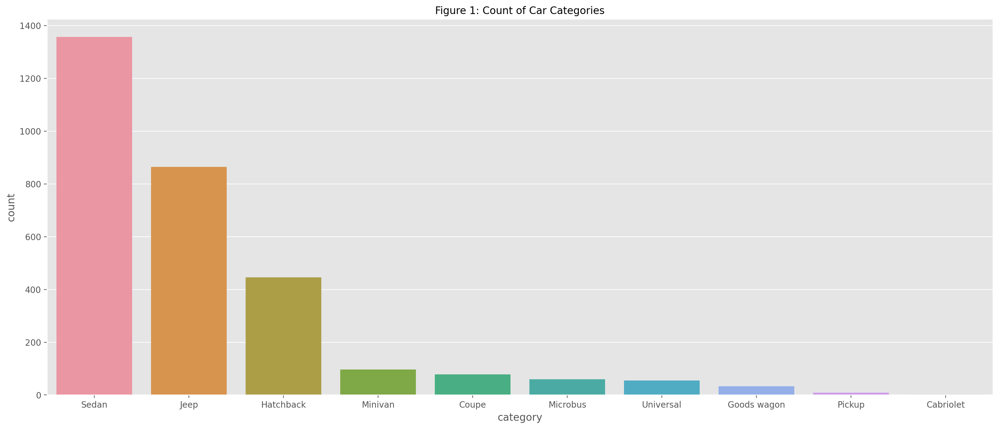

In [145]:
mpt.figure(figsize = (20,8))
fig = sb.countplot(x = 'category', data = df_set_sam, order = df_set_sam['category'].value_counts().index)
fig = mpt.title('Figure 1: Count of Car Categories', fontsize = 12)
mpt.show()

#### Bar Chart of Car Manufacturing Companies

Similarly as figure 1, we have counted the maximum number of car companies presented in the data to understand the trend within customers who are inclining towards buying from a specific brand, and we can say Hyundai is the most popular one. 

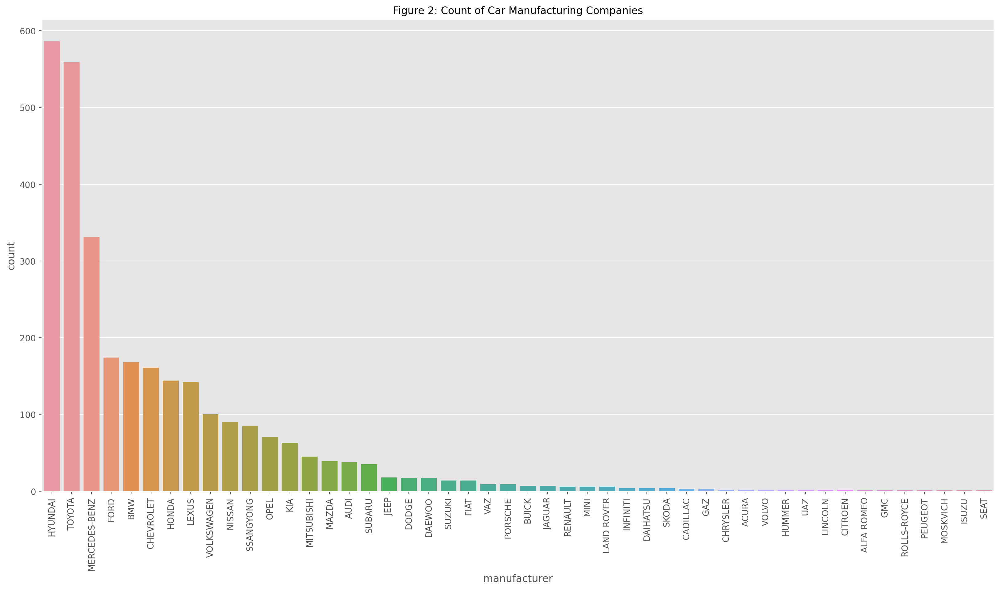

In [146]:
mpt.figure(figsize = (20,10))
fig = sb.countplot(x = 'manufacturer', data = df_set_sam, order = df_set_sam['manufacturer'].value_counts().index)
fig = mpt.title('Figure 2: Count of Car Manufacturing Companies', fontsize = 12)
mpt.xticks(rotation=90)
mpt.show()

### Two-Variable Plot

#### Boxplot of Price by Car Categories

Based on the below plot of Figure 4 when we compare the price range with different categories, then Jeep has the highest price despite Sedan being most preferred by the customers.

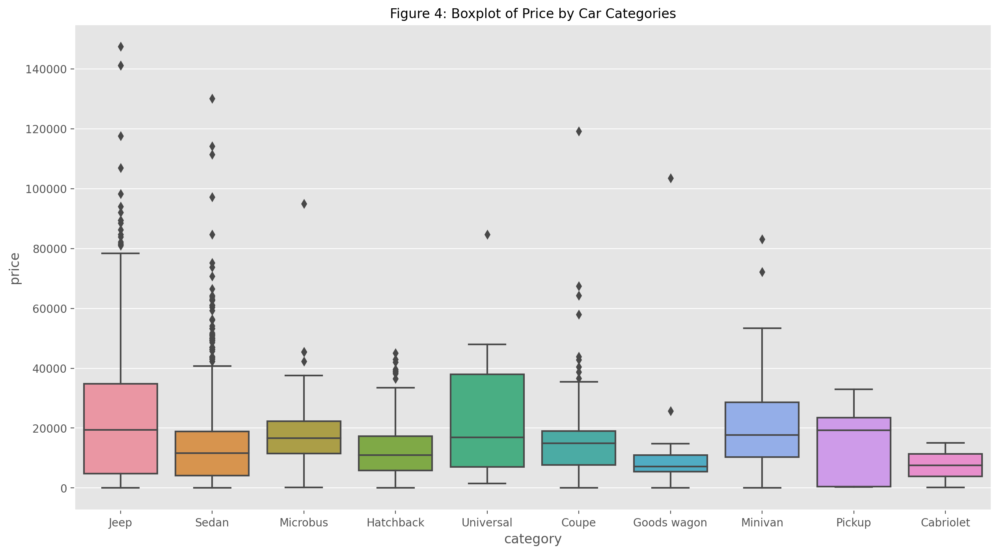

In [147]:
mpt.figure(figsize = (15,8))
sb.boxplot(df_set_sam['category'], df_set_sam['price']);
mpt.title('Figure 4: Boxplot of Price by Car Categories', fontsize = 12)
mpt.show()

#### Boxplot of Price by Car Manufacturer

From Figure 5, Comparing the manufactures and the price at which they are sold, Jeep as a company brand has set the highest price for selling their cars.

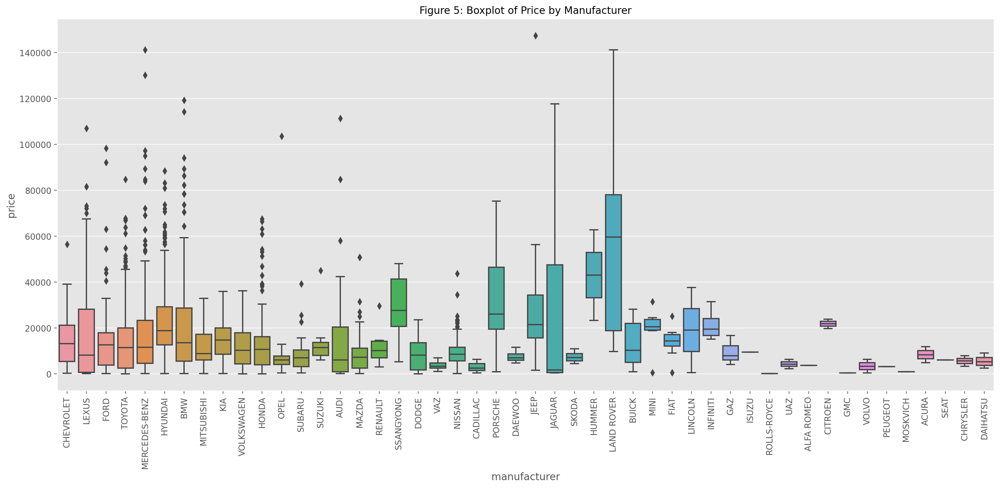

In [148]:
mpt.figure(figsize = (20,8))
sb.boxplot(df_set_sam['manufacturer'], df_set_sam['price']);
mpt.title('Figure 5: Boxplot of Price by Manufacturer', fontsize = 12)
mpt.xticks(rotation=90)
mpt.show()

#### Scatterplot of Price and Car Produced Year

We can clearly see from the below figure 6, that there has been a constant rise in the prices of the car since the year 2010 to 2020.

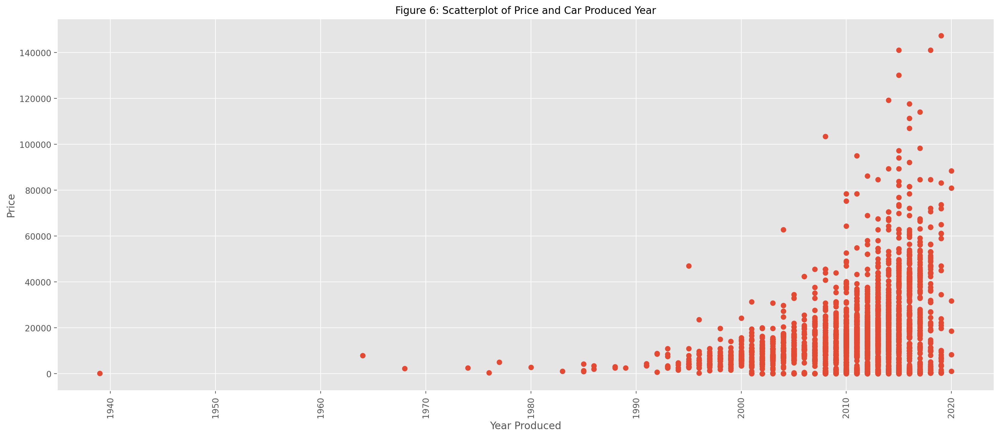

In [149]:
mpt.figure(figsize = (20,8))
mpt.scatter(df_set_sam['Year'], df_set_sam['price'])
mpt.title('Figure 6: Scatterplot of Price and Car Produced Year', fontsize = 12)
mpt.xlabel('Year Produced')
mpt.ylabel('Price')
mpt.xticks(rotation=90)
mpt.show()

### Three-Variable Plot

#### Scatterplot of Price broken down by Category and Manufacturer

In Figure 7, We have broken down the data by price for the manufacturer with respect to their different car categories in which when we compare the data amongst highest price range for brands like Jeep, Toyota, Land Rover etc, then Jeep as a Car Categories turns out be the common choice across other brands too.

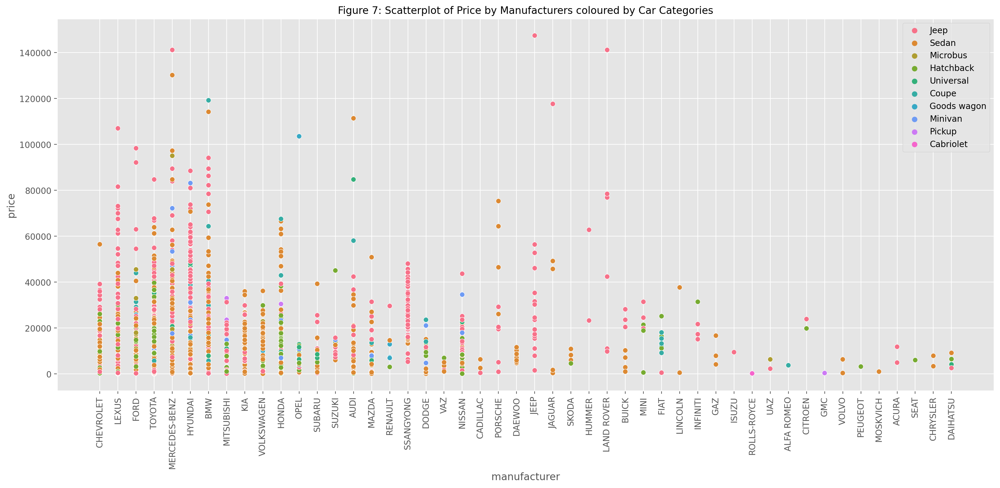

In [150]:
mpt.figure(figsize = (20,8))
sb.scatterplot(df_set_sam['manufacturer'], df_set_sam['price'], hue = df_set_sam['category'])
mpt.title('Figure 7: Scatterplot of Price by Manufacturers coloured by Car Categories', fontsize = 12);
mpt.legend(loc = 'upper right')
mpt.xticks(rotation=90)
mpt.show()

#### Boxplot of Price broken down by Category and Fuel_Type

Along with the increase the prices of the car, we have also seen that the fuel rates are also increasing and when we compare the fuel type along with different categories of car then we can see a common pattern in Figure 8, that diesel type vehicle are more expensive apart from a few categories like Sedan & Coupe where Petrol Type are more expensive.

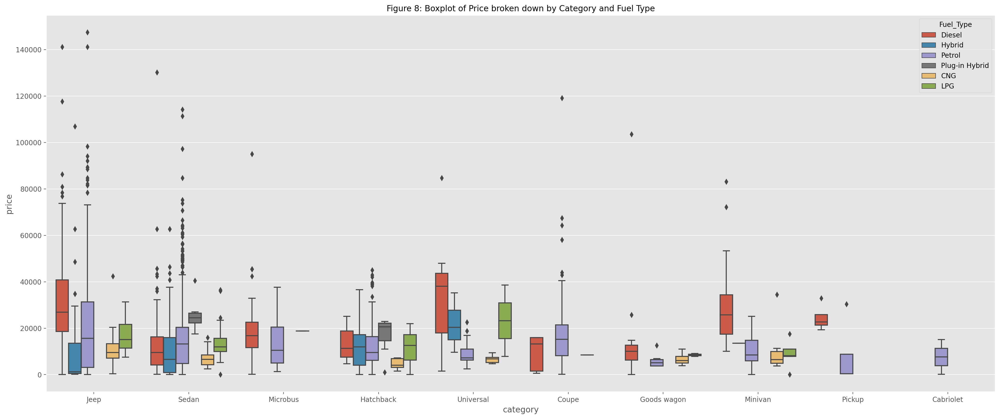

In [151]:
mpt.figure(figsize = (25,10))
sb.boxplot(df_set_sam['category'], df_set_sam['price'], 
            hue = df_set_sam['Fuel_Type'])
mpt.title('Figure 8: Boxplot of Price broken down by Category and Fuel Type', fontsize = 12)
mpt.show()

#### Boxplot of Price broken down by Interiors and Airbags

Along with the type of the fuel and engine build, we can observe a pattern in figure 9 that more the amenities while designing the car, more the price of the car which becomes an additional factor.

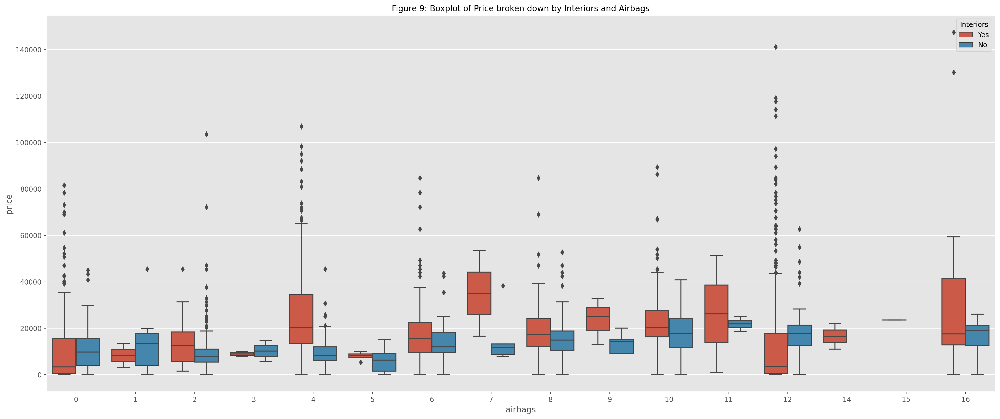

In [152]:
mpt.figure(figsize = (25,10))
sb.boxplot(df_set_sam['airbags'], df_set_sam['price'], 
            hue = df_set_sam['Interiors'])
mpt.title('Figure 9: Boxplot of Price broken down by Interiors and Airbags', fontsize = 12)
mpt.show()

### Predictive Modelling

####  Feature Selection (FS)

Feature Sampling or Selection is done to make the process more accurate by selecting certain set of features. Here, we are restricting the values the number of features to 10.

In [153]:
#Dropping the price column to make it the target feature before splitting the data
df_new_set = df_set_sam.drop(columns='price')
target = df_set_sam.price
target.value_counts()

price
18817    46
470      46
15681    42
10976    41
392      40
         ..
21683     1
17813     1
32393     1
6583      1
4701      1
Name: count, Length: 841, dtype: int64

In [154]:
cat_cols = df_new_set.columns[df_new_set.dtypes==object].tolist()

In [155]:
cat_cols

['manufacturer',
 'model',
 'category',
 'Interiors',
 'Fuel_Type',
 'Engine_Volume',
 'mileage',
 'Gear_Box_Type',
 'Drive_Wheels',
 'wheel',
 'color']

In [156]:
for col in cat_cols:
    if (df_new_set[col].nunique() == 2):
        df_new_set[col] = pd.get_dummies(df_new_set[col], drop_first=True)
   
#use one-hot-encoding for categorical features with >2 levels
df_new_set = pd.get_dummies(df_new_set)

In [157]:
df_new_set.columns

Index(['Year', 'Interiors', 'cylinders', 'wheel', 'airbags',
       'manufacturer_ACURA', 'manufacturer_ALFA ROMEO', 'manufacturer_AUDI',
       'manufacturer_BMW', 'manufacturer_BUICK',
       ...
       'color_Green', 'color_Grey', 'color_Orange', 'color_Pink',
       'color_Purple', 'color_Red', 'color_Silver', 'color_Sky blue',
       'color_White', 'color_Yellow'],
      dtype='object', length=2525)

In [158]:
#Scaling the dataset
from sklearn import preprocessing

Data_s_df = df_new_set.copy()

Data_scaler_df = preprocessing.MinMaxScaler()
Data_scaler_df.fit(df_new_set)
Data = Data_scaler_df.fit_transform(df_new_set)

In [159]:
#Sample of the dataset after scaling
pd.DataFrame(Data, columns=Data_s_df.columns).sample(20, random_state=3959656)

Year  Interiors  cylinders  wheel  airbags  manufacturer_ACURA  \
1545  0.876543        1.0   0.272727    1.0    0.250                 0.0   
2137  0.962963        1.0   0.272727    0.0    0.750                 0.0   
2013  0.740741        0.0   0.272727    0.0    0.000                 0.0   
546   0.888889        1.0   0.454545    0.0    0.750                 0.0   
566   0.876543        0.0   0.272727    0.0    0.750                 0.0   
790   0.925926        1.0   0.454545    0.0    0.750                 0.0   
1303  0.962963        1.0   0.272727    0.0    0.250                 0.0   
2238  0.728395        0.0   0.272727    0.0    0.125                 0.0   
1579  0.938272        1.0   0.272727    0.0    0.250                 0.0   
2846  0.901235        1.0   0.272727    0.0    0.750                 0.0   
562   0.827160        1.0   0.454545    0.0    0.750                 0.0   
72    0.962963        1.0   0.272727    0.0    0.750                 0.0   
1122  0.765432        1.0   0.272727    0.0    0.250                 0.0   
2181  0.790123        0.0   0.272727    1.0    0.375                 0.0   
2583  0.802469        1.0   0.454545    0.0    0.625                 0.0   
140   0.925926        1.0   0.272727    0.0    0.250                 0.0   
1793  0.950617        1.0   0.272727    1.0    0.750                 0.0   
1174  0.864198        1.0   0.272727    0.0    0.250                 0.0   
2786  0.864198        1.0   0.272727    0.0    0.250                 0.0   
100   0.925926        0.0   0.272727    0.0    0.375                 0.0   

      manufacturer_ALFA ROMEO  manufacturer_AUDI  manufacturer_BMW  \
1545                      0.0                0.0               0.0   
2137                      0.0                0.0               0.0   
2013                      0.0                0.0               0.0   
546                       0.0                0.0               0.0   
566                       0.0                0.0               0.0   
790                       0.0                0.0               0.0   
1303                      0.0                0.0               0.0   
2238                      0.0                0.0               0.0   
1579                      0.0                0.0               0.0   
2846                      0.0                0.0               0.0   
562                       0.0                0.0               0.0   
72                        0.0                0.0               0.0   
1122                      1.0                0.0               0.0   
2181                      0.0                0.0               0.0   
2583                      0.0                0.0               0.0   
140                       0.0                0.0               0.0   
1793                      0.0                0.0               0.0   
1174                      0.0                0.0               0.0   
2786                      0.0                0.0               0.0   
100                       0.0                0.0               0.0   

      manufacturer_BUICK  manufacturer_CADILLAC  manufacturer_CHEVROLET  \
1545                 0.0                    0.0                     0.0   
2137                 0.0                    0.0                     0.0   
2013                 0.0                    0.0                     0.0   
546                  0.0                    0.0                     0.0   
566                  0.0                    0.0                     0.0   
790                  0.0                    0.0                     0.0   
1303                 0.0                    0.0                     0.0   
2238                 0.0                    0.0                     0.0   
1579                 0.0                    0.0                     0.0   
2846                 0.0                    0.0                     0.0   
562                  0.0                    0.0                     0.0   
72                   0.0                  

We are using the function **RandomForestClassifier** & **SelectKBest** in order to get 10 different features from the dataset in order to use them while fitting the model below. We will be plotting a graph to demonstrate these feature and it's respective importance.

In [160]:
from sklearn.ensemble import RandomForestClassifier

num_features = 10
model_rfi = RandomForestClassifier(n_estimators=100)
model_rfi.fit(Data, target)
fs_indices_rfi = np.argsort(model_rfi.feature_importances_)[::-1][0:num_features]

best_features_rfi = Data_s_df.columns[fs_indices_rfi].values
best_features_rfi

array(['Year', 'airbags', 'color_White', 'color_Black', 'color_Silver',
       'color_Grey', 'category_Sedan', 'cylinders', 'Fuel_Type_Petrol',
       'color_Blue'], dtype=object)

In [161]:
feature_importances_rfi = model_rfi.feature_importances_[fs_indices_rfi]
feature_importances_rfi

array([0.06338541, 0.02698643, 0.01824949, 0.0180436 , 0.017467  ,
       0.01337859, 0.01137149, 0.01102468, 0.01034467, 0.00924064])

In [162]:
import matplotlib.pyplot as plt
%matplotlib inline 
%config InlineBackend.figure_format = 'retina'
plt.style.use("ggplot")

def plot_imp(best_features, scores, method_name):   
    plt.barh(best_features, scores)
    plt.title(method_name + ' Feature Importances')
    plt.xlabel("Importance")
    plt.ylabel("Features")
    plt.show()

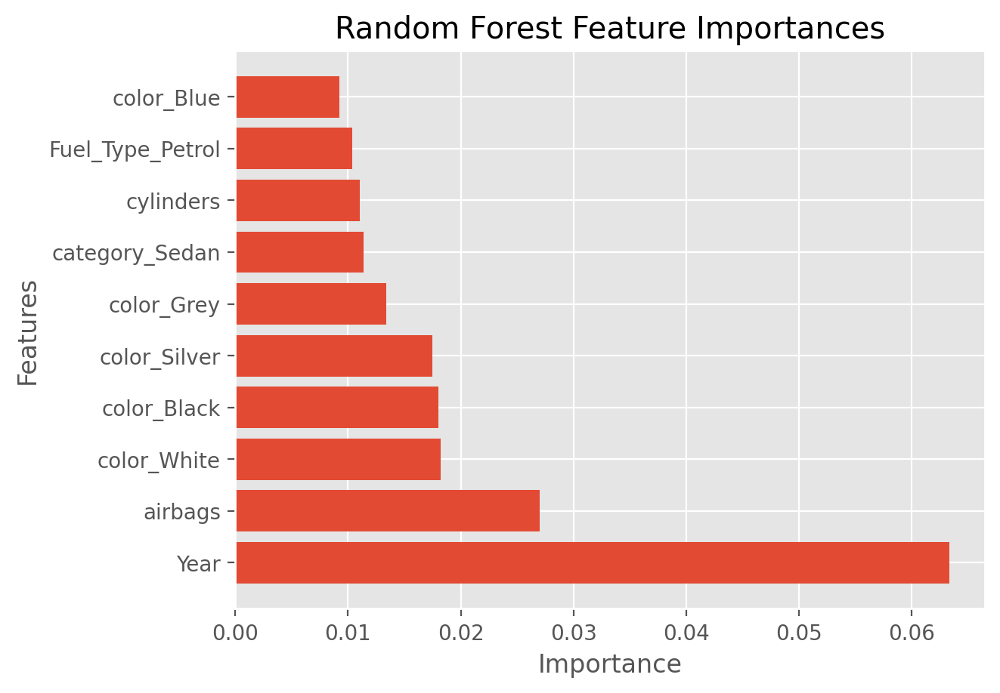

In [163]:
plot_imp(best_features_rfi, feature_importances_rfi, 'Random Forest')

### Data Sampling & Train-Test Splitting

In [164]:
X = pd.DataFrame(Data).values
y = pd.DataFrame(target).values

print(X.shape)
print(y.shape)

(3000, 2525)
(3000, 1)


In [165]:
#Sliptting the dataset into training and testing dataset
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=3959656)

In [166]:
#Scaling the dataset after the splitting
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [167]:
#Performing the feature selection from using the SelectKBest function for regression models with function as f_regression 
from sklearn.feature_selection import SelectKBest, f_regression

selector = SelectKBest(score_func=f_regression, k=10)
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_test_scaled)

In [168]:
from sklearn.model_selection import StratifiedKFold

cv_regression = StratifiedKFold(n_splits=5, shuffle=True, random_state=3959656)

### Model Model Fitting & Tuning

#### Linear Regression

In [169]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import RandomizedSearchCV

param = {
    'fit_intercept':[True, False],
}

# Train the regression model
regressor_linear = LinearRegression()
search_linear = RandomizedSearchCV(regressor_linear, param, n_jobs=-1, cv=cv_regression)
result_linear = search_linear.fit(X_train_selected, y_train)

# Predict using the selected features
y_pred_linear = result_linear.predict(X_test_selected)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred_linear.flatten()})
df

,Actual,Predicted
0,11290,12285.295157
1,392,20860.911253
2,3300,7733.815286
3,13642,17184.982756
4,16621,7319.098479
...,...,...
895,24775,11380.230832
896,78403,20655.617087
897,13172,23002.011291
898,15681,18168.906449


In [170]:
result_linear.get_params()

{'cv': StratifiedKFold(n_splits=5, random_state=3959656, shuffle=True),
 'error_score': nan,
 'estimator__copy_X': True,
 'estimator__fit_intercept': True,
 'estimator__n_jobs': None,
 'estimator__positive': False,
 'estimator': LinearRegression(),
 'n_iter': 10,
 'n_jobs': -1,
 'param_distributions': {'fit_intercept': [True, False]},
 'pre_dispatch': '2*n_jobs',
 'random_state': None,
 'refit': True,
 'return_train_score': False,
 'scoring': None,
 'verbose': 0}

In [171]:
result_linear.score(X_train_selected,y_train)

0.33045000475382513

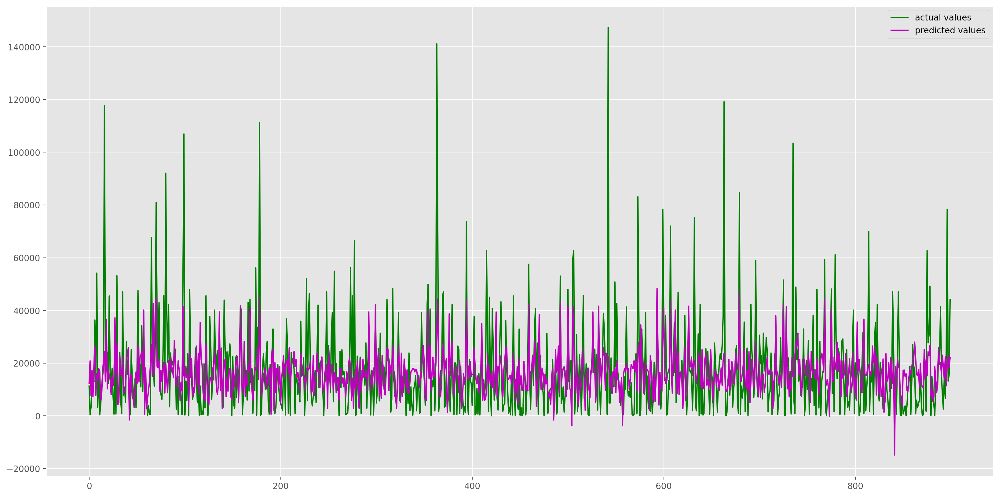

In [172]:
# figure size
mpt.figure(figsize=(20, 10))

# acutal values
mpt.plot([x for x in range(len(y_test))],np.array(y_test), c='g', label="actual values")

# predicted values
mpt.plot([x for x in range(len(y_test))],y_pred_linear, c='m',label="predicted values")
mpt.legend()
mpt.show()

#### Ridge Regression

In [173]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import RandomizedSearchCV

param_ridge = {
    'solver':['svd', 'cholesky', 'lsqr', 'sag'],
    'alpha': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100],
    'fit_intercept':[True, False],
}

# Train the regression model
regressor_ridge = Ridge()
search_ridge = RandomizedSearchCV(regressor_ridge, param_ridge, n_jobs=-1, cv=cv_regression)
result_ridge = search_ridge.fit(X_train_selected, y_train)

# Predict using the selected features
y_pred_ridge = result_ridge.predict(X_test_selected)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred_ridge.flatten()})
df

,Actual,Predicted
0,11290,12341.822831
1,392,20675.253061
2,3300,8177.947686
3,13642,17118.175836
4,16621,7599.399331
...,...,...
895,24775,11649.421401
896,78403,20591.542864
897,13172,22618.695580
898,15681,18175.107655


In [174]:
result_ridge.get_params()

{'cv': StratifiedKFold(n_splits=5, random_state=3959656, shuffle=True),
 'error_score': nan,
 'estimator__alpha': 1.0,
 'estimator__copy_X': True,
 'estimator__fit_intercept': True,
 'estimator__max_iter': None,
 'estimator__positive': False,
 'estimator__random_state': None,
 'estimator__solver': 'auto',
 'estimator__tol': 0.0001,
 'estimator': Ridge(),
 'n_iter': 10,
 'n_jobs': -1,
 'param_distributions': {'solver': ['svd', 'cholesky', 'lsqr', 'sag'],
  'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
  'fit_intercept': [True, False]},
 'pre_dispatch': '2*n_jobs',
 'random_state': None,
 'refit': True,
 'return_train_score': False,
 'scoring': None,
 'verbose': 0}

In [175]:
result_ridge.score(X_train_selected,y_train)

0.33003193000722675

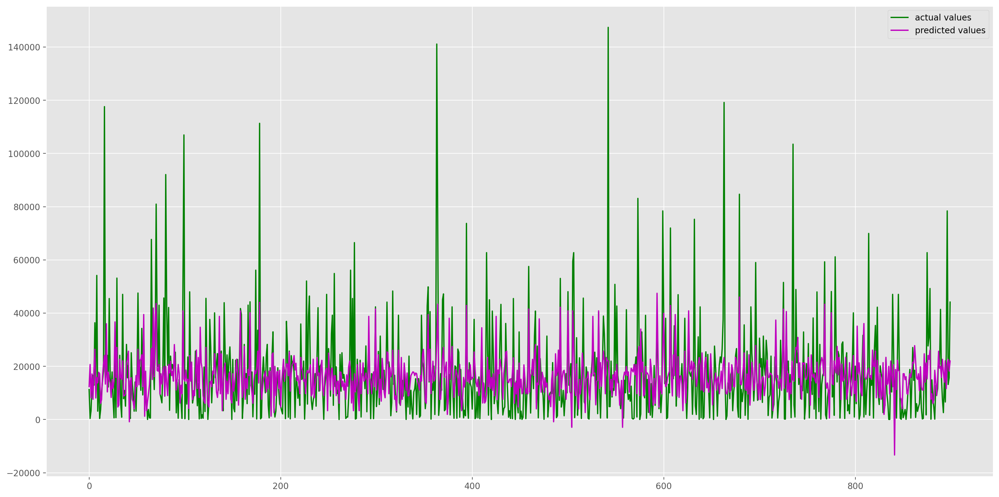

In [176]:
# figure size
mpt.figure(figsize=(20, 10))

# acutal values
mpt.plot([x for x in range(len(y_test))],np.array(y_test), c='g', label="actual values")

# predicted values
mpt.plot([x for x in range(len(y_test))],y_pred_ridge, c='m',label="predicted values")
mpt.legend()
mpt.show()

#### Gradient Boosted Trees

In [177]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV

param_gbr = {
    'max_depth': [1,2,3,4],
    'min_samples_split':[1,2,3,4]
}

# Train the regression model
regressor_gbr = GradientBoostingRegressor()
search_gbr = RandomizedSearchCV(regressor_gbr, param_gbr, n_jobs=-1, cv=cv_regression)
result_gbr = search_gbr.fit(X_train_selected, y_train)

# Predict using the selected features
y_pred_gbr = result_gbr.predict(X_test_selected)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred_gbr.flatten()})
df

,Actual,Predicted
0,11290,12618.709368
1,392,22625.133562
2,3300,8295.418093
3,13642,14581.487569
4,16621,9486.775512
...,...,...
895,24775,11267.886070
896,78403,16567.092588
897,13172,22122.138026
898,15681,19509.950210


In [178]:
result_gbr.get_params()

{'cv': StratifiedKFold(n_splits=5, random_state=3959656, shuffle=True),
 'error_score': nan,
 'estimator__alpha': 0.9,
 'estimator__ccp_alpha': 0.0,
 'estimator__criterion': 'friedman_mse',
 'estimator__init': None,
 'estimator__learning_rate': 0.1,
 'estimator__loss': 'squared_error',
 'estimator__max_depth': 3,
 'estimator__max_features': None,
 'estimator__max_leaf_nodes': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__n_estimators': 100,
 'estimator__n_iter_no_change': None,
 'estimator__random_state': None,
 'estimator__subsample': 1.0,
 'estimator__tol': 0.0001,
 'estimator__validation_fraction': 0.1,
 'estimator__verbose': 0,
 'estimator__warm_start': False,
 'estimator': GradientBoostingRegressor(),
 'n_iter': 10,
 'n_jobs': -1,
 'param_distributions': {'max_depth': [1, 2, 3, 4],
  'min_samples_split': [1, 2, 3, 4]},
 'pre_dispatch': '2*n_jobs',
 'ra

In [179]:
result_gbr.score(X_train_selected,y_train)

0.4622214694809694

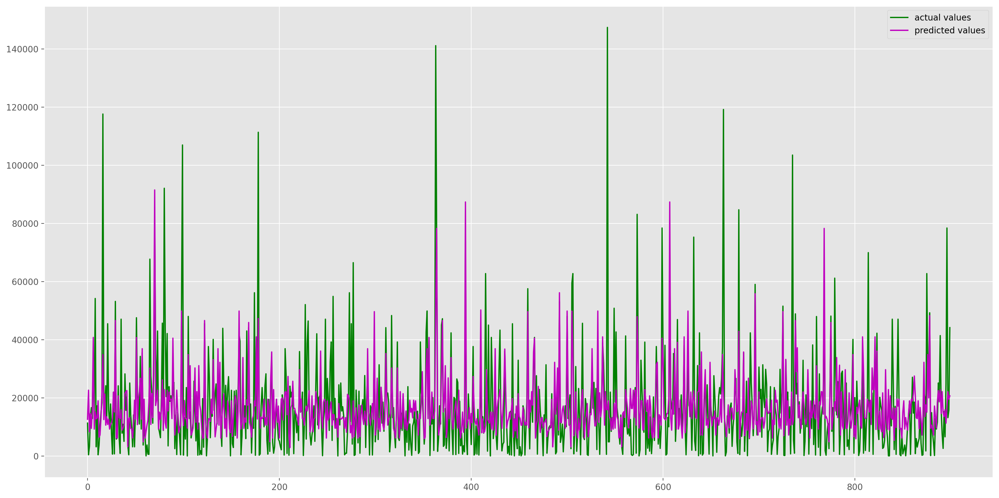

In [180]:
# figure size
mpt.figure(figsize=(20, 10))

# acutal values
mpt.plot([x for x in range(len(y_test))],np.array(y_test), c='g', label="actual values")

# predicted values
mpt.plot([x for x in range(len(y_test))],y_pred_gbr, c='m',label="predicted values")
mpt.legend()
mpt.show()

#### Decision Trees

In [181]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV

param_dtr = {
    'max_depth': [1,2,3,4],
    'min_samples_split':[1,2,3,4]
}

# Train the regression model
regressor_dtr = DecisionTreeRegressor()
search_dtr = RandomizedSearchCV(regressor_dtr, param_dtr, n_jobs=-1, cv=cv_regression)
result_dtr = search_dtr.fit(X_train_selected, y_train)

# Predict using the selected features
y_pred_dtr = result_dtr.predict(X_test_selected)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred_dtr.flatten()})
df

,Actual,Predicted
0,11290,12045.781073
1,392,17485.830904
2,3300,7575.904459
3,13642,15755.537102
4,16621,12045.781073
...,...,...
895,24775,7575.904459
896,78403,15755.537102
897,13172,22872.302198
898,15681,17485.830904


In [182]:
result_dtr.get_params()

{'cv': StratifiedKFold(n_splits=5, random_state=3959656, shuffle=True),
 'error_score': nan,
 'estimator__ccp_alpha': 0.0,
 'estimator__criterion': 'squared_error',
 'estimator__max_depth': None,
 'estimator__max_features': None,
 'estimator__max_leaf_nodes': None,
 'estimator__min_impurity_decrease': 0.0,
 'estimator__min_samples_leaf': 1,
 'estimator__min_samples_split': 2,
 'estimator__min_weight_fraction_leaf': 0.0,
 'estimator__random_state': None,
 'estimator__splitter': 'best',
 'estimator': DecisionTreeRegressor(),
 'n_iter': 10,
 'n_jobs': -1,
 'param_distributions': {'max_depth': [1, 2, 3, 4],
  'min_samples_split': [1, 2, 3, 4]},
 'pre_dispatch': '2*n_jobs',
 'random_state': None,
 'refit': True,
 'return_train_score': False,
 'scoring': None,
 'verbose': 0}

In [183]:
result_dtr.score(X_train_selected,y_train)

0.36386270381443353

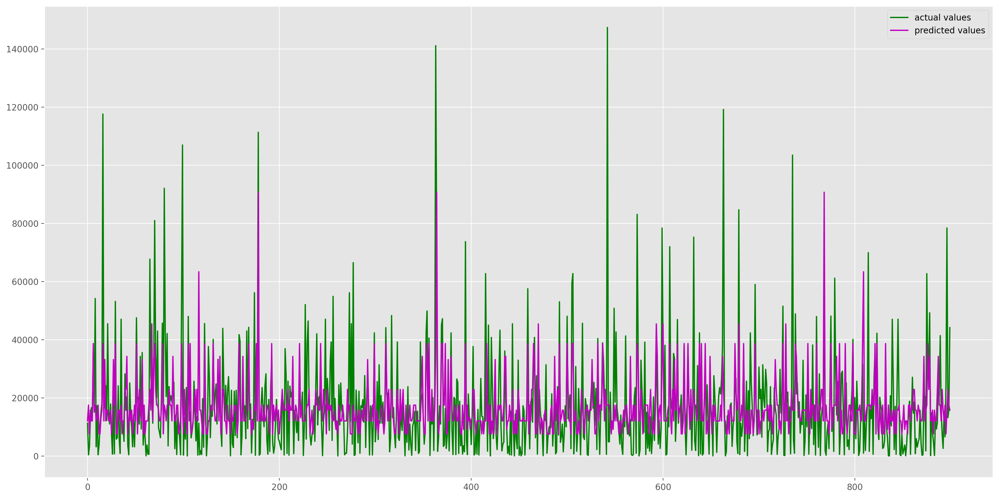

In [184]:
# figure size
mpt.figure(figsize=(20, 10))

# acutal values
mpt.plot([x for x in range(len(y_test))],np.array(y_test), c='g', label="actual values")

# predicted values
mpt.plot([x for x in range(len(y_test))],y_pred_dtr, c='m',label="predicted values")
mpt.legend()
mpt.show()

#### Bayesian Ridge

In [185]:
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import RandomizedSearchCV

param_bridge = {
    'alpha_2': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100],
    'alpha_1': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100],
    'fit_intercept':[True, False],
}

# Train the regression model
regressor_bridge = BayesianRidge()
search_bridge = RandomizedSearchCV(regressor_bridge, param_bridge, n_jobs=-1, cv=cv_regression)
result_bridge = search_bridge.fit(X_train_selected, y_train)

# Predict using the selected features
y_pred_bridge = result_bridge.predict(X_test_selected)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred_bridge.flatten()})
df

,Actual,Predicted
0,11290,12300.206945
1,392,20807.106070
2,3300,7863.671109
3,13642,17164.621298
4,16621,7399.825678
...,...,...
895,24775,11459.069709
896,78403,20637.962383
897,13172,22889.996572
898,15681,18171.966227


In [186]:
result_bridge.get_params()

{'cv': StratifiedKFold(n_splits=5, random_state=3959656, shuffle=True),
 'error_score': nan,
 'estimator__alpha_1': 1e-06,
 'estimator__alpha_2': 1e-06,
 'estimator__alpha_init': None,
 'estimator__compute_score': False,
 'estimator__copy_X': True,
 'estimator__fit_intercept': True,
 'estimator__lambda_1': 1e-06,
 'estimator__lambda_2': 1e-06,
 'estimator__lambda_init': None,
 'estimator__max_iter': None,
 'estimator__n_iter': 'deprecated',
 'estimator__tol': 0.001,
 'estimator__verbose': False,
 'estimator': BayesianRidge(),
 'n_iter': 10,
 'n_jobs': -1,
 'param_distributions': {'alpha_2': [1e-05,
   0.0001,
   0.001,
   0.01,
   0.1,
   1,
   10,
   100],
  'alpha_1': [1e-05, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
  'fit_intercept': [True, False]},
 'pre_dispatch': '2*n_jobs',
 'random_state': None,
 'refit': True,
 'return_train_score': False,
 'scoring': None,
 'verbose': 0}

In [187]:
result_bridge.score(X_train_selected,y_train)

0.3304150572655128

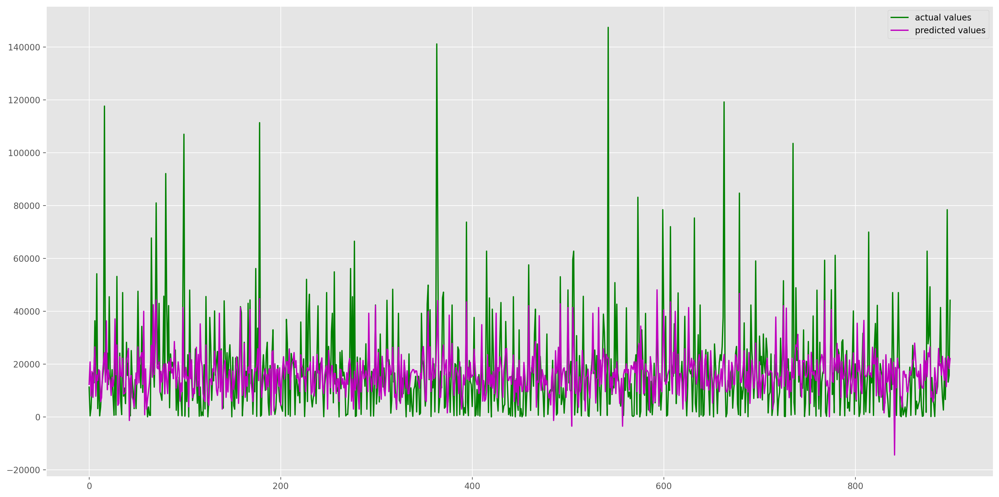

In [188]:
# figure size
mpt.figure(figsize=(20, 10))

# acutal values
mpt.plot([x for x in range(len(y_test))],np.array(y_test), c='g', label="actual values")

# predicted values
mpt.plot([x for x in range(len(y_test))],y_pred_bridge, c='m',label="predicted values")
mpt.legend()
mpt.show()

#### KNN Regression

In [189]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV

param_KNN = {
    'n_neighbors': [1,2,3,4,5],
    'weights':['uniform','distance'],
    'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute']
}

# Train the regression model
regressor_KNN = KNeighborsRegressor()
search_KNN = RandomizedSearchCV(regressor_KNN, param_KNN, n_jobs=-1, cv=cv_regression)
result_KNN = search_KNN.fit(X_train_selected, y_train)

# Predict using the selected features
y_pred_KNN = result_KNN.predict(X_test_selected)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred_KNN.flatten()})
df

,Actual,Predicted
0,11290,18408.8
1,392,8210.0
2,3300,10788.0
3,13642,15352.0
4,16621,12011.4
...,...,...
895,24775,19631.8
896,78403,10885.2
897,13172,24775.2
898,15681,21248.8


In [190]:
result_KNN.get_params()

{'cv': StratifiedKFold(n_splits=5, random_state=3959656, shuffle=True),
 'error_score': nan,
 'estimator__algorithm': 'auto',
 'estimator__leaf_size': 30,
 'estimator__metric': 'minkowski',
 'estimator__metric_params': None,
 'estimator__n_jobs': None,
 'estimator__n_neighbors': 5,
 'estimator__p': 2,
 'estimator__weights': 'uniform',
 'estimator': KNeighborsRegressor(),
 'n_iter': 10,
 'n_jobs': -1,
 'param_distributions': {'n_neighbors': [1, 2, 3, 4, 5],
  'weights': ['uniform', 'distance'],
  'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']},
 'pre_dispatch': '2*n_jobs',
 'random_state': None,
 'refit': True,
 'return_train_score': False,
 'scoring': None,
 'verbose': 0}

In [191]:
result_KNN.score(X_train_selected,y_train)

0.3754782547414275

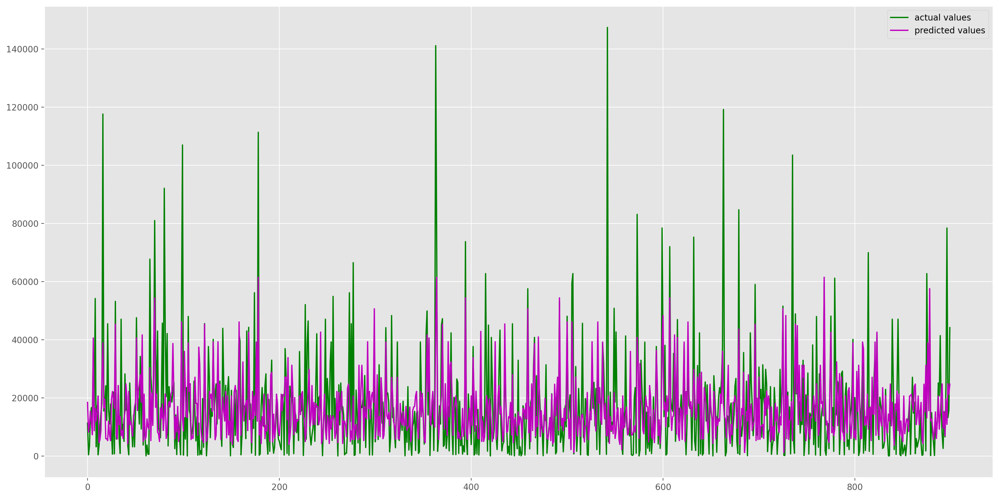

In [192]:
# figure size
mpt.figure(figsize=(20, 10))

# acutal values
mpt.plot([x for x in range(len(y_test))],np.array(y_test), c='g', label="actual values")

# predicted values
mpt.plot([x for x in range(len(y_test))],y_pred_KNN, c='m',label="predicted values")
mpt.legend()
mpt.show()

#### Neural Network Modelling

In [193]:
from sklearn.neural_network import MLPRegressor

param_MLP = {
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver':['lbfgs', 'sgd', 'adam'],
    'learning_rate':['constant', 'invscaling', 'adaptive'],
    'max_iter': [100]
}

# Train the regression model
regressor_MLP = MLPRegressor()
search_MLP = RandomizedSearchCV(regressor_MLP, param_MLP)
result_MLP = search_MLP.fit(X_train_selected, y_train)

# Predict using the selected features
y_pred_MLP = result_MLP.predict(X_test_selected)
df = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred_MLP.flatten()})
df

,Actual,Predicted
0,11290,11579.804278
1,392,21115.156343
2,3300,9056.468783
3,13642,11420.014575
4,16621,11131.807902
...,...,...
895,24775,10243.599747
896,78403,14105.731514
897,13172,26789.481459
898,15681,16375.242700


In [194]:
result_MLP.get_params()

{'cv': None,
 'error_score': nan,
 'estimator__activation': 'relu',
 'estimator__alpha': 0.0001,
 'estimator__batch_size': 'auto',
 'estimator__beta_1': 0.9,
 'estimator__beta_2': 0.999,
 'estimator__early_stopping': False,
 'estimator__epsilon': 1e-08,
 'estimator__hidden_layer_sizes': (100,),
 'estimator__learning_rate': 'constant',
 'estimator__learning_rate_init': 0.001,
 'estimator__max_fun': 15000,
 'estimator__max_iter': 200,
 'estimator__momentum': 0.9,
 'estimator__n_iter_no_change': 10,
 'estimator__nesterovs_momentum': True,
 'estimator__power_t': 0.5,
 'estimator__random_state': None,
 'estimator__shuffle': True,
 'estimator__solver': 'adam',
 'estimator__tol': 0.0001,
 'estimator__validation_fraction': 0.1,
 'estimator__verbose': False,
 'estimator__warm_start': False,
 'estimator': MLPRegressor(),
 'n_iter': 10,
 'n_jobs': None,
 'param_distributions': {'activation': ['identity',
   'logistic',
   'tanh',
   'relu'],
  'solver': ['lbfgs', 'sgd', 'adam'],
  'learning_rate'

In [195]:
result_MLP.score(X_train_selected,y_train)

0.34701752588737

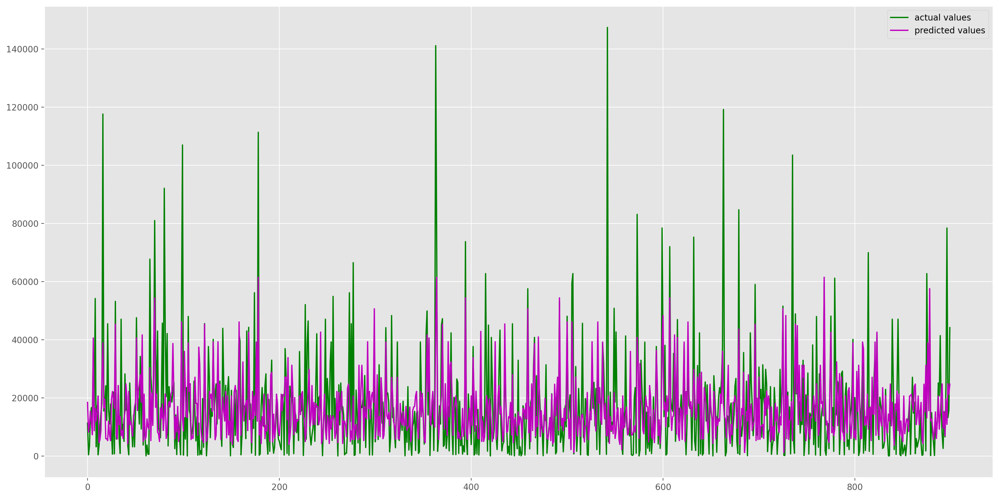

In [196]:
# figure size
mpt.figure(figsize=(20, 10))

# acutal values
mpt.plot([x for x in range(len(y_test))],np.array(y_test), c='g', label="actual values")

# predicted values
mpt.plot([x for x in range(len(y_test))],y_pred_KNN, c='m',label="predicted values")
mpt.legend()
mpt.show()

#### Cross-Validation and Evaluating the Neural Network Model

In [197]:
from sklearn.model_selection import cross_val_score

cv_tptest = StratifiedKFold(n_splits=10, shuffle=True, random_state=3959656)

In [198]:
cv_MLP = cross_val_score(estimator=search_MLP.best_estimator_,
                                 X=X_train,
                                 y=y_train, 
                                 cv=cv_tptest, 
                                 n_jobs=-1,
                                 scoring='neg_mean_squared_error')
cv_MLP.mean()

std_mean_MLP = -cv_MLP.mean()
print(std_mean_MLP)

246307975.2039402


In [199]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse_MLP = mean_squared_error(y_test, y_pred_MLP)
mae_MLP = mean_absolute_error(y_test, y_pred_MLP)
r2_MLP = r2_score(y_test, y_pred_MLP)
print("Mean Squared Error (MSE) for MLP Regressor:", mse_MLP)
print("Mean Absolute Error (MAE) for MLP Regressor:", mae_MLP)
print("R-squared (R2) for MLP Regressor:", r2_MLP)

Mean Squared Error (MSE) for MLP Regressor: 229341010.8096283
Mean Absolute Error (MAE) for MLP Regressor: 9710.288671280292
R-squared (R2) for MLP Regressor: 0.27102509406281794


### Model Comparison

In [200]:
from sklearn.model_selection import cross_val_score

cv_tptest = StratifiedKFold(n_splits=10, shuffle=True, random_state=3959656)

In [201]:
cv_dtr = cross_val_score(estimator=search_dtr.best_estimator_,
                                 X=X_train,
                                 y=y_train, 
                                 cv=cv_tptest, 
                                 n_jobs=-1,
                                 scoring='neg_mean_squared_error')
cv_dtr.mean()

std_mean_dtr = -cv_dtr.mean()
print(std_mean_dtr)

164409720.80692896


In [202]:
cv_ridge = cross_val_score(estimator=search_ridge.best_estimator_,
                                 X=X_train,
                                 y=y_train, 
                                 cv=cv_tptest, 
                                 n_jobs=-1,
                                 scoring='neg_mean_squared_error')
cv_ridge.mean()

std_mean_ridge = -cv_ridge.mean()
print(std_mean_ridge)

180209014.54793447


In [203]:
cv_linear = cross_val_score(estimator=search_linear.best_estimator_,
                                 X=X_train,
                                 y=y_train, 
                                 cv=cv_tptest, 
                                 n_jobs=-1,
                                 scoring='neg_mean_squared_error')
cv_linear.mean()

std_mean_linear = -cv_linear.mean()
print(std_mean_linear)

3.24144151406284e+33


In [204]:
cv_bridge = cross_val_score(estimator=search_bridge.best_estimator_,
                                 X=X_train,
                                 y=y_train, 
                                 cv=cv_tptest, 
                                 n_jobs=-1,
                                 scoring='neg_mean_squared_error')
cv_bridge.mean()

std_mean_bridge = -cv_bridge.mean()
print(std_mean_bridge)

141464369.90159255


In [205]:
cv_KNN = cross_val_score(estimator=search_KNN.best_estimator_,
                                 X=X_train,
                                 y=y_train, 
                                 cv=cv_tptest, 
                                 n_jobs=-1,
                                 scoring='neg_mean_squared_error')
cv_KNN.mean()

std_mean_KNN = -cv_KNN.mean()
print(std_mean_KNN)

148130754.9997143


In [206]:
cv_gbr = cross_val_score(estimator=search_gbr.best_estimator_,
                                 X=X_train,
                                 y=y_train, 
                                 cv=cv_tptest, 
                                 n_jobs=-1,
                                 scoring='neg_mean_squared_error')
cv_gbr.mean()

std_mean_gbr = -cv_gbr.mean()
print(std_mean_gbr)

117181682.09826219


In [207]:
from scipy import stats

print(stats.ttest_rel(cv_dtr, cv_ridge))
print(stats.ttest_rel(cv_ridge, cv_bridge))
print(stats.ttest_rel(cv_dtr, cv_bridge))
print(stats.ttest_rel(cv_gbr, cv_bridge))
print(stats.ttest_rel(cv_ridge, cv_gbr))
print(stats.ttest_rel(cv_dtr, cv_gbr))

TtestResult(statistic=2.810572619903863, pvalue=0.020358006546866324, df=9)
TtestResult(statistic=-8.627114430782216, pvalue=1.2053286088551843e-05, df=9)
TtestResult(statistic=-2.493440235763833, pvalue=0.03422825615679691, df=9)
TtestResult(statistic=5.477530465941932, pvalue=0.00039141571610469273, df=9)
TtestResult(statistic=-12.289021832490313, pvalue=6.285335336192804e-07, df=9)
TtestResult(statistic=-5.300100216000515, pvalue=0.0004937917740179744, df=9)


In [208]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)
print("Mean Squared Error (MSE) for Ridge Regressor:", mse_ridge)
print("Mean Absolute Error (MAE) for Ridge Regressor:", mae_ridge)
print("R-squared (R2) for Ridge Regressor:", r2_ridge)

Mean Squared Error (MSE) for Ridge Regressor: 236833287.23328495
Mean Absolute Error (MAE) for Ridge Regressor: 9958.42945268722
R-squared (R2) for Ridge Regressor: 0.24721041965325885


In [209]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse_bridge = mean_squared_error(y_test, y_pred_bridge)
mae_bridge = mean_absolute_error(y_test, y_pred_bridge)
r2_bridge = r2_score(y_test, y_pred_bridge)
print("Mean Squared Error (MSE) for Bayesian Ridge Regressor:", mse_bridge)
print("Mean Absolute Error (MAE) for Bayesian Ridge Regressor:", mae_bridge)
print("R-squared (R2) for Bayesian Ridge Regressor:", r2_bridge)

Mean Squared Error (MSE) for Bayesian Ridge Regressor: 236468632.80823296
Mean Absolute Error (MAE) for Bayesian Ridge Regressor: 9976.170233269522
R-squared (R2) for Bayesian Ridge Regressor: 0.2483694968033221


In [210]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse_dtr = mean_squared_error(y_test, y_pred_dtr)
mae_dtr = mean_absolute_error(y_test, y_pred_dtr)
r2_dtr = r2_score(y_test, y_pred_dtr)
print("Mean Squared Error (MSE) for Decision Tree Regressor:", mse_dtr)
print("Mean Absolute Error (MAE) for Decision Tree Regressor:", mae_dtr)
print("R-squared (R2) for Decision Tree Regressor:", r2_dtr)

Mean Squared Error (MSE) for Decision Tree Regressor: 230889242.90544906
Mean Absolute Error (MAE) for Decision Tree Regressor: 9868.50445249307
R-squared (R2) for Decision Tree Regressor: 0.2661039404390698


In [211]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
mse_gbr = mean_squared_error(y_test, y_pred_gbr)
mae_gbr = mean_absolute_error(y_test, y_pred_gbr)
r2_gbr = r2_score(y_test, y_pred_gbr)
print("Mean Squared Error (MSE) for Gradient Boosted Tree Regressor:", mse_gbr)
print("Mean Absolute Error (MAE) for Gradient Boosted Tree Regressor:", mae_gbr)
print("R-squared (R2) for Gradient Boosted Tree Regressor:", r2_gbr)

Mean Squared Error (MSE) for Gradient Boosted Tree Regressor: 209062018.75987136
Mean Absolute Error (MAE) for Gradient Boosted Tree Regressor: 9097.858866923161
R-squared (R2) for Gradient Boosted Tree Regressor: 0.3354831526969251


In [212]:
from tabulate import tabulate

table = [['Regression Model Name','Mean Squared Error (MSE)','Mean Absolute Error (MAE)','R-squared (R2)'],
         ['Ridge Regressor','236354320.8173506','9983.120886467115','0.2487328446952093'],
         ['Bayesian Ridge Regressor','236468632.79699245','9976.170233910389','0.24836949683905074'],
         ['Decision Tree Regressor','230889242.90544906','9868.50445249307','0.2661039404390698'],
         ['Gradient Boosted Tree Regressor','209177258.06121585','9102.643970032352','0.33511685729009266']]

print(tabulate(table, headers='firstrow',tablefmt="fancy_grid"))

╒═════════════════════════════════╤════════════════════════════╤═════════════════════════════╤══════════════════╕
│ Regression Model Name           │   Mean Squared Error (MSE) │   Mean Absolute Error (MAE) │   R-squared (R2) │
╞═════════════════════════════════╪════════════════════════════╪═════════════════════════════╪══════════════════╡
│ Ridge Regressor                 │                2.36354e+08 │                     9983.12 │         0.248733 │
├─────────────────────────────────┼────────────────────────────┼─────────────────────────────┼──────────────────┤
│ Bayesian Ridge Regressor        │                2.36469e+08 │                     9976.17 │         0.248369 │
├─────────────────────────────────┼────────────────────────────┼─────────────────────────────┼──────────────────┤
│ Decision Tree Regressor         │                2.30889e+08 │                     9868.5  │         0.266104 │
├─────────────────────────────────┼────────────────────────────┼────────────────────────

### Critique & Limitations

Firstly, we had to use RandomizedSearchCV instead of GridSearchCV, as each algorithm was taking ample amount of time to process which was hampering the progress of the project. Secondly, since we used RandomizedSearchCV, it selects random parameter from the parameter grind, which might state that the model would not be fitted properly to best of it's ability and accuracy but it is much faster in comparison to GridSearchCV. Hence, looking at the best_scores for all the algorithms, then we can observe a common value in the range of 0.35-0.45 which is relatively low, hence if we had the ability to use GridSearchCV which selects the best set of features which predicting the model then we could fitted the model in a even better fashion, with a increase in accuracy and better results.

Secondly, if we observe the graphs plotted for each algorithms between actual and predicted value where the actual value is green and predicted in magenta then we can observe that for Linear, Ridge and Bayesian Regression Model we can observe certain prediction values which are negative which aren't correct and certainly it's not the case with other parameters. There could be various reasons for it like Data Scaling or Overfitting, or if the selected featured dataset for that algorithm is skewed towards negative values, or error in the data itself could be causing this issue. 

While performing cross-validation, for several models we observe NAN as the outcomes for reasons like Outliers or Missing Values, which is certainly not the case with other regression models, which could become a limitation to test all the model for it's best purpose and following could be some reasons for while which we should keep in mind while designing a regression model.

 - Linearity Assumptions: This assumption can lead to a lot of inaccurate prediction, and it seems difficult to find the best fit model at times
 - Overfitting and Underfitting: Regression Models are prone to this problem especially when we are dealing with complex problems
 - Feature Selection: Incorrect set of features could lead to a lot of problems hence this becomes a really important step.
 
Along with lot of limitation for regression models, there are some benefits that the predicted values is really easily to read and interpretable which makes it a bit easy in the real world scenario. Regression models provides us with various evaluation metrics for us to find the best fit model as done above in order to find one and they are easy to compute and execute unlike some of the classification problems.

### Summary & Conclusions

#### Project Summary

When we started this project, we took a regression problem to predict the prices of the car where we decided to use various regression problems starting from Linear Regression, Decision Trees, KNN Regressor etc. Predictive Modelling isn't just about the final step of building the model, and fitting the data and finally predicted the values based on the actual ones. Prior to that, there are multiples step that are performed in order to reach the final step for predictions.

As part of the phase 1, we initially search for a dataset which fits our purposes and I decided to use this dataset from a competition of predictive modelling, considering the current state of the market regarding the car prices. After finding the data, I performed the data pre-processing activity where at start, we check for the datatype of each variable, then check for the missing values and outliers, if any in order to remove them from the dataset before building the model. Later, we check for unique values & dropped the unnecessary or redundant data and finally tabulated the final columns that we were going to use at part of this project. Once we finished the pre-processing steps, we setup various data visualization in order to understand and analyze the data and it's insights and meaningful data where we got to know about the price hike started from year 2000, and Jeep being the car type which was in most demand, and also the amenities provided in the car adds up to the final production of car using various plot types like barplot, boxplot, histogram, etc for single, double and multiple variable plots.

After finishing the phase 1, we started off with the phase 2 which was the main part where we were going to do predictive modelling. We took the same steps as we did in the first phase for data pre-processing to further work upon the dataset. We had already observed that most of columns of the dataset are object datatype for which we had to perform hot-encoding in order to transform them numerical columns and scale them so that the data can be close to each other. Once done, we will using the train split function to divide the data into training and testing subsets before we start to use them for modelling.

Before starting modelling, we had to select the best features in form of feature sampling for which we used various functions but restricted to the number of features to just ten. Now that we are all ready to start modelling, we selected the number of different algorithms that we need to perform as part of this regression problem. After selecting the list of algorithms, we fitted the model using the training and testing data, and later fitted the model in order to predict the car prices and compare it with the actual price by plotting a graph to identify the pattern and scores for each model to understand the more efficient one.

At last, we had to compare the models by using t-test using cross validation function where we used the metrics neg_mean_squared_error since it's a regression problem and multiple the output with minus one to get the positive value for comparison. Using the output of the cross-validation, we performed the t-test to get the value of p and lastly ending the project by using different evaluation metrics to identify the best fit model across all the algorithms used where we used Mean Squared Error (MSE), Mean Absolute Error (MAE), R-squared (R2). Finally, I ended up populated these values or output in form of a table for anyone to read it easily and understand which is the best model for predicting the car prices.

#### Summary of Findings

We used three different evaluation metrics to compare the algorithms and find the best fit model for predicting the car price.

 - Mean Squared Error (MSE): It is a measure to calculate the average squared difference between the predicted and actual values. Lower the value, better the model.
 - Mean Absolute Error (MAE): Metric to calculate the average absolute difference between the predicted and actual values. Lower value of MAE states a better fit.
 - R-squared (R2): Measures the proportion of the variance in the dependent variable that is predictable from the independent variables. Higher value indicated better fit model.
 
Now, we compare the results tabulated in the table then we can say that **Gradient Boosted Tree Regressor** is the best fit model for predicting the car prices, as the MSE and MAE value is lower in comparison to other models and R2 is better than everyone else.

Apart from this, as part of this project we came across some problems where we couldn't validate the KNN Regressor and Linear Regression. There could be various reasons for it, like inconsistent data, missing values, outliers, or some kind of data leakage. This is something which we could put a lot more emphasis on when I do predictive modelling next time either it be a classification or a regression problem so that we don't come across this problem and to summarize I can take this as a learning curve for me for future.

#### Conclusions

Firstly, we were successful in cleaning the data and performing the pre-processing activity, and at the same time getting a lot of insights from the dataset by plotting various visualizations but when we started the process to predict the model then we realized that we should have checked the datatype more carefully in order to identify if we had object datatype and should have removed them as part of the pre-processing process which we failed to, but we picked up that task to perform hot endcoding before splitting the data and scaling the dataset.

At start, we listed down six different algorithms and we were based to train and fit the model for each type and predict the actual vs predicted value, and plot a graph to identify the pattern at the same time. We faced some hiccups when we started to compare the data by performing t-test, due to some reasons either be it missing value/overfitting or outliers we couldn't validate Linear Regression & KNN Regressor, and we received NAN as the output but we were able to get the output for other algorithms.

Using the three evaluation metrics, Mean Squared Error (MSE), Mean Absolute Error (MAE), R-squared (R2) and finally tabulating the output. We can say that **Gradient Boosted Tree Regressor** is the best fit model for predicting the car prices, as the MSE and MAE is low in compared to others and R2 should be higher for better efficiency which is actually the case here. Hence, the goal and objective of both phase are successfully achieved and we were able to find the best fit model for the car price prediction.

### References

Contractor.D. (n.d). Car Price Prediction Challenge (Kaggle). https://www.kaggle.com/datasets/deepcontractor/car-price-prediction-challenge